In [104]:
'''

Humidity is the water content of the mixture of water vapor and other elements found in the air while 
relative humidity is the percentage of water vapor in the air at a given temperature

'''

'\n\nHumidity is the water content of the mixture of water vapor and other elements found in the air while \nrelative humidity is the percentage of water vapor in the air at a given temperature\n\n'

In [105]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
#import plotly.io as pio
%matplotlib inline

In [106]:
#Importing the dataset:
data = pd.read_csv(r"D:\00 MSIG\01 Agriculture\00 Parametric\Amako San\Datasets\Weather Data\weather_depok (2009-2021).csv")
pd.set_option('max_columns',100)
pd.set_option('max_rows',100)
pd.options.display.float_format = "{:,.3f}".format

#To check the number of rows & columns in given dataset:
print(data.shape)
#To remove the scientific notation from values:
data = data.round(3)
#To print the top 5 rows from given dataset:
data.head()

(4732, 10)


,date,Year,Weather,Max,Min,Wind,Rain,Humdity,Cloud,Pressure
0,01-01-2009,2009,Light rain shower,29 °c,21 °c,9 km/h\nWSW,2.4 mm,79%,42%,1008 mb
1,01-01-2010,2010,Patchy light drizzle,29 °c,21 °c,9 km/h\nSW,4.2 mm,86%,56%,1008 mb
2,01-01-2011,2011,Patchy rain possible,31 °c,21 °c,11 km/h\nWSW,0.5 mm,76%,23%,1006 mb
3,01-01-2012,2012,Moderate or heavy rain shower,31 °c,24 °c,5 km/h\nWNW,12.2 mm,80%,42%,1009 mb
4,01-01-2013,2013,Light rain shower,31 °c,23 °c,6 km/h\nWNW,6.4 mm,81%,66%,1009 mb


In [107]:
'''Data Cleaning'''

data["Max"].replace(to_replace=" °c", value='', regex=True, inplace=True)
data["Max"]=pd.to_numeric(data["Max"], errors="coerce")

data["Min"].replace(to_replace=" °c", value='', regex=True, inplace=True)
data["Min"]=pd.to_numeric(data["Min"], errors="coerce")

data["Wind"].replace(to_replace=" km/h\nWSW", value='', regex=True, inplace=True)
data["Wind"].replace(to_replace=" km/h\nSW", value='', regex=True, inplace=True)
data["Wind"]=pd.to_numeric(data["Wind"], errors="coerce")

data["Rain"].replace(to_replace=" mm", value='', regex=True, inplace=True)
data["Rain"]=pd.to_numeric(data["Rain"], errors="coerce")

data["Humdity"].replace(to_replace="%", value='', regex=True, inplace=True)
data["Humdity"]=pd.to_numeric(data["Humdity"], errors="coerce")

data["Cloud"].replace(to_replace="%", value='', regex=True, inplace=True)
data["Cloud"]=pd.to_numeric(data["Cloud"], errors="coerce")

data["Pressure"].replace(to_replace=" mb", value='', regex=True, inplace=True)
data["Pressure"]=pd.to_numeric(data["Pressure"], errors="coerce")

In [108]:
data.head()

,date,Year,Weather,Max,Min,Wind,Rain,Humdity,Cloud,Pressure
0,01-01-2009,2009,Light rain shower,29,21,9.000,2.400,79,42,1008
1,01-01-2010,2010,Patchy light drizzle,29,21,9.000,4.200,86,56,1008
2,01-01-2011,2011,Patchy rain possible,31,21,11.000,0.500,76,23,1006
3,01-01-2012,2012,Moderate or heavy rain shower,31,24,nan,12.200,80,42,1009
4,01-01-2013,2013,Light rain shower,31,23,nan,6.400,81,66,1009


## Correlation between different weather parameters on daily level:

['Humdity', 'Cloud', 'Rain', 'Year', 'Pressure', 'Wind', 'Min', 'Max']
Humdity     1.000
Cloud       0.564
Rain        0.458
Year       -0.256
Pressure   -0.279
Wind       -0.362
Min        -0.404
Max        -0.852
Name: Humdity, dtype: float64


<AxesSubplot:>

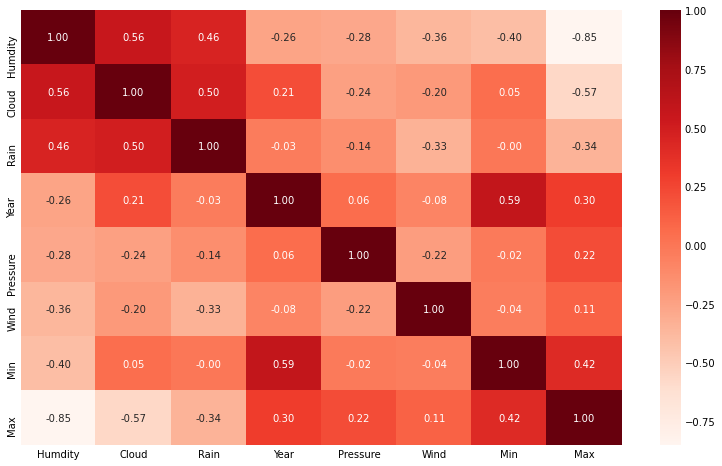

In [109]:
# It shows that humidity is: 
# having high negative correlation with Max Temp (-0.85) &
# having negative correlation with Min Temp (-0.40) &
# having positive correlation with Rain (0.46)


corrs = data.corr()["Humdity"].sort_values(ascending=False)
#rice_corrs = rice_corrs[(rice_corrs > 0.3)|(rice_corrs < -0.3)]
corr_cols = corrs.index.tolist()
print(corr_cols)

print(corrs)
plt.figure(figsize=(12,8))
plt.tick_params(labelsize=10)
sns.heatmap(data[corr_cols].corr(),annot=True, cmap= plt.cm.Reds, fmt='.2f')

In [110]:
data['date'] = pd.to_datetime(data['date'])
data["Month"] = data["date"].apply(lambda x: x.month)
data["month-day"] = data['date'].apply(lambda x: x.strftime('%m-%d'))
data = data[data["month-day"] != "02-29"]

#wt['Month'] = pd.DatetimeIndex(wt['date']).month
data['Week'] = pd.DatetimeIndex(data['date']).week
print(data.shape)
data.head()

(4732, 13)


<ipython-input-110-ab34a5a61165>:7: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



,date,Year,Weather,Max,Min,Wind,Rain,Humdity,Cloud,Pressure,Month,month-day,Week
0,2009-01-01,2009,Light rain shower,29,21,9.000,2.400,79,42,1008,1,01-01,1
1,2010-01-01,2010,Patchy light drizzle,29,21,9.000,4.200,86,56,1008,1,01-01,53
2,2011-01-01,2011,Patchy rain possible,31,21,11.000,0.500,76,23,1006,1,01-01,52
3,2012-01-01,2012,Moderate or heavy rain shower,31,24,nan,12.200,80,42,1009,1,01-01,52
4,2013-01-01,2013,Light rain shower,31,23,nan,6.400,81,66,1009,1,01-01,1


In [111]:
data.sort_values(by="date", axis=0, ascending=True, inplace=True)
data.reset_index(inplace=True)
data.drop(["index"],axis=1,inplace=True)
data.head()

,date,Year,Weather,Max,Min,Wind,Rain,Humdity,Cloud,Pressure,Month,month-day,Week
0,2009-01-01,2009,Light rain shower,29,21,9.000,2.400,79,42,1008,1,01-01,1
1,2009-01-02,2009,Light rain shower,27,20,nan,3.400,88,52,1010,1,01-02,1
2,2009-01-03,2009,Patchy rain possible,29,21,nan,0.900,85,31,1008,1,01-03,1
3,2009-01-04,2009,Moderate or heavy rain shower,30,20,nan,18.000,84,37,1008,1,01-04,1
4,2009-01-05,2009,Patchy rain possible,31,21,nan,0.900,77,18,1011,1,01-05,2


In [112]:
df = data.drop(["date","Weather"],axis=1)
df.head()

,Year,Max,Min,Wind,Rain,Humdity,Cloud,Pressure,Month,month-day,Week
0,2009,29,21,9.000,2.400,79,42,1008,1,01-01,1
1,2009,27,20,nan,3.400,88,52,1010,1,01-02,1
2,2009,29,21,nan,0.900,85,31,1008,1,01-03,1
3,2009,30,20,nan,18.000,84,37,1008,1,01-04,1
4,2009,31,21,nan,0.900,77,18,1011,1,01-05,2


## Yearly Wise:

In [113]:
df1 = data.groupby('Year').agg({'date':'max','Max':'max','Min':'min','Wind':'mean','Rain':'sum','Humdity':['min','max','mean','sum'],'Cloud':'mean','Pressure':'mean'})
df1.columns=['date','max_Temp','min_temp','wind_avg','rain_total','humidity_min','humidity_max','humidity_mean','humidity_total','cloud_mean','pressure_mean',]
df1.reset_index(inplace=True)
df1

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean
0,2009,2009-12-30,34,17,6.676,"3,210.100",55,95,79.080,28785,33.008,"1,010.286"
1,2010,2010-12-30,33,19,6.149,"4,303.500",62,95,82.558,30051,36.646,"1,009.824"
2,2011,2011-12-30,35,19,6.989,"2,142.100",59,90,76.245,27753,28.948,"1,009.462"
3,2012,2012-12-30,36,19,6.939,"2,414.700",54,86,75.288,27405,27.505,"1,009.676"
4,2013,2013-12-30,36,19,6.754,"2,615.300",59,87,74.827,27237,30.371,"1,009.415"
5,2014,2014-12-30,37,19,6.098,"2,129.900",45,93,74.962,27286,29.451,"1,010.170"
6,2015,2015-12-30,37,20,7.562,"1,483.500",39,83,66.011,24028,25.637,"1,010.948"
7,2016,2016-12-30,36,21,7.186,"2,032.500",56,84,71.291,25950,33.140,"1,010.330"
8,2017,2017-12-30,38,21,7.487,"1,412.800",48,85,67.571,24596,29.121,"1,010.217"
9,2018,2018-12-30,38,22,7.957,789.700,42,81,64.692,23548,24.830,"1,010.310"


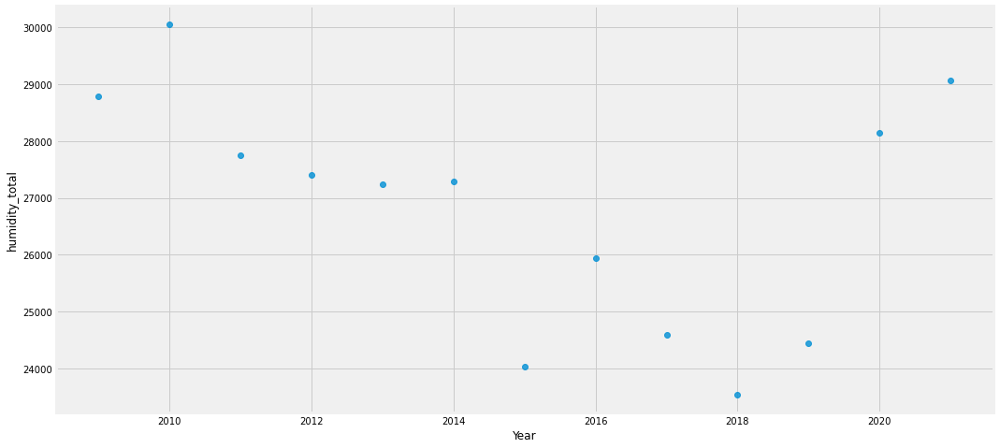

In [114]:
plt.figure(figsize=(16,8))
sns.regplot(x = "Year",y="humidity_total",fit_reg = False,data=df1)
plt.show()

## Monthly Wise:

In [115]:
mm = data.groupby(['Year','Month']).agg({'date':'max','Max':'max','Min':'min','Wind':'mean','Rain':'sum','Humdity':['min','max','mean','sum'],'Cloud':'mean','Pressure':'mean'})
mm.columns=['date','max_Temp','min_temp','wind_avg','rain_total','humidity_min','humidity_max','humidity_mean','humidity_total','cloud_mean','pressure_mean',]
mm.reset_index(inplace=True)
mm

,Year,Month,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean
0,2009,1,2009-01-31,32,18,7.000,206.600,69,91,83.323,2583,37.000,"1,010.097"
1,2009,2,2009-02-28,32,20,8.800,332.000,68,93,83.179,2329,43.000,"1,009.286"
2,2009,3,2009-03-31,33,19,6.000,318.100,64,92,80.710,2502,31.935,"1,010.129"
3,2009,4,2009-04-30,34,18,6.000,275.100,69,88,80.267,2408,30.733,"1,010.467"
4,2009,5,2009-05-31,33,20,5.200,289.100,68,88,81.129,2515,32.935,"1,009.516"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,2021,8,2021-08-31,35,21,6.200,174.100,65,91,76.065,2358,44.387,"1,009.935"
152,2021,9,2021-09-30,36,22,4.800,160.200,66,94,76.800,2304,54.633,"1,009.633"
153,2021,10,2021-10-31,36,23,4.833,185.700,64,87,77.226,2394,56.000,"1,009.903"
154,2021,11,2021-11-30,34,23,5.100,172.200,68,93,79.967,2399,55.700,"1,008.833"


## Weekly Wise:

In [116]:
ww = data.groupby(['Year','Month','Week']).agg({'date':'max','Max':'max','Min':'min','Wind':'mean','Rain':'sum','Humdity':['min','max','mean','sum'],'Cloud':'mean','Pressure':'mean'})
ww.columns=['date','max_Temp','min_temp','wind_avg','rain_total','humidity_min','humidity_max','humidity_mean','humidity_total','cloud_mean','pressure_mean',]
ww.reset_index(inplace=True)
ww.head(10)

,Year,Month,Week,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean
0,2009,1,1,2009-01-04,30,20,9.000,24.700,79,88,84.000,336,40.500,"1,008.500"
1,2009,1,2,2009-01-11,32,18,nan,13.600,69,83,75.143,526,24.000,"1,010.857"
2,2009,1,3,2009-01-18,31,20,6.000,37.300,80,91,85.857,601,43.000,"1,011.714"
3,2009,1,4,2009-01-25,29,19,6.000,82.000,84,89,86.000,602,32.143,"1,009.429"
4,2009,1,5,2009-01-31,29,20,nan,49.000,83,91,86.333,518,48.500,"1,009.167"
5,2009,2,5,2009-02-01,31,21,8.000,0.700,77,77,77.000,77,24.000,"1,009.000"
6,2009,2,6,2009-02-08,31,20,8.000,86.000,68,93,81.286,569,32.143,"1,010.143"
7,2009,2,7,2009-02-15,32,21,11.667,38.900,70,87,78.429,549,42.429,"1,010.000"
8,2009,2,8,2009-02-22,29,20,6.000,114.800,83,89,85.857,601,49.000,"1,009.000"
9,2009,2,9,2009-02-28,29,21,8.333,91.600,87,90,88.833,533,52.500,"1,007.833"


<AxesSubplot:>

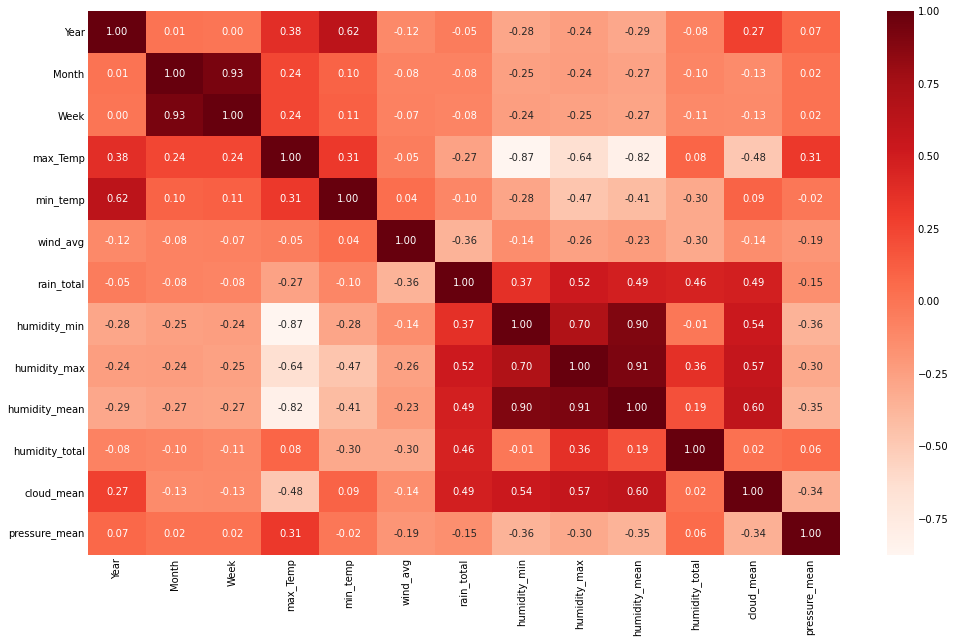

In [117]:
plt.figure(figsize=(15,10))
plt.tick_params(labelsize=10)
sns.heatmap(ww.corr(),annot=True, cmap= plt.cm.Reds, fmt='.2f')

## Visualisations:

In [118]:
import plotly.offline as pyo
pyo.init_notebook_mode()

In [119]:
fig = px.line(mm,x='Year',y='humidity_total',color="Year",title="Measurement of Humidity according to Year")
fig.show()

In [120]:
fig = px.line(mm,x='Month',y='humidity_total',color="Year",title="Measurement of Humidity according to Year")
fig.show()

## Crop Production Data:

In [121]:
#Importing the dataset:
pro = pd.read_excel(r"D:\00 MSIG\01 Agriculture\00 Parametric\Amako San\Datasets\Rice Production - Depok.xlsx")
pro

,Year,Rice Production
0,2010,"4,828.000"
1,2011,"4,985.000"
2,2012,"3,962.000"
3,2013,"1,880.000"
4,2014,"2,031.000"
5,2015,"1,475.000"
6,2016,nan
7,2017,nan
8,2018,360.000
9,2019,465.030


## Merging Crop Production & Weather Data:

In [122]:
new = pd.merge(df1, pro, on='Year', how="left")
new

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean,Rice Production
0,2009,2009-12-30,34,17,6.676,"3,210.100",55,95,79.080,28785,33.008,"1,010.286",nan
1,2010,2010-12-30,33,19,6.149,"4,303.500",62,95,82.558,30051,36.646,"1,009.824","4,828.000"
2,2011,2011-12-30,35,19,6.989,"2,142.100",59,90,76.245,27753,28.948,"1,009.462","4,985.000"
3,2012,2012-12-30,36,19,6.939,"2,414.700",54,86,75.288,27405,27.505,"1,009.676","3,962.000"
4,2013,2013-12-30,36,19,6.754,"2,615.300",59,87,74.827,27237,30.371,"1,009.415","1,880.000"
5,2014,2014-12-30,37,19,6.098,"2,129.900",45,93,74.962,27286,29.451,"1,010.170","2,031.000"
6,2015,2015-12-30,37,20,7.562,"1,483.500",39,83,66.011,24028,25.637,"1,010.948","1,475.000"
7,2016,2016-12-30,36,21,7.186,"2,032.500",56,84,71.291,25950,33.140,"1,010.330",nan
8,2017,2017-12-30,38,21,7.487,"1,412.800",48,85,67.571,24596,29.121,"1,010.217",nan
9,2018,2018-12-30,38,22,7.957,789.700,42,81,64.692,23548,24.830,"1,010.310",360.000


## Humidity w.r.t Rice Production

In [123]:
fig = px.scatter(new,x='humidity_total', y ='Rice Production',color="Year",title = "Measurement of Rice Production according to Humidity Total")
fig.show()

In [124]:
fig = px.scatter(new,x='humidity_mean', y ='Rice Production',color="Year",title = "Measurement of Rice Production according to Humidity Mean")
fig.show()

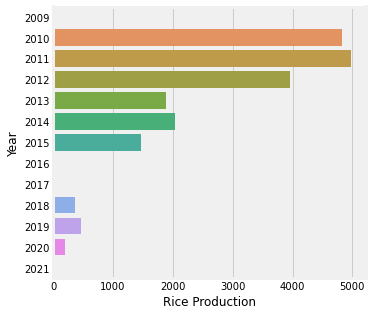

In [125]:
plt.figure(figsize= (5,5))
sns.barplot(x = new['Rice Production'], y = new["Year"], orient='h');

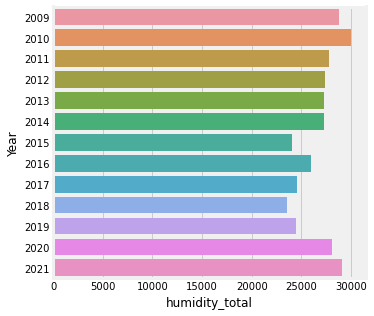

In [126]:
plt.figure(figsize= (5,5))
sns.barplot(x = new['humidity_total'],y = new["Year"], orient='h');

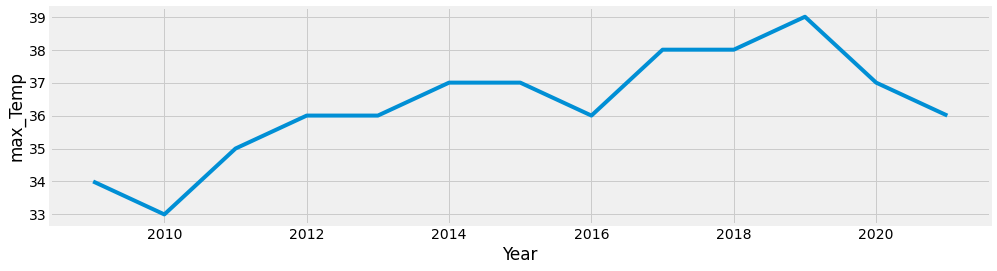

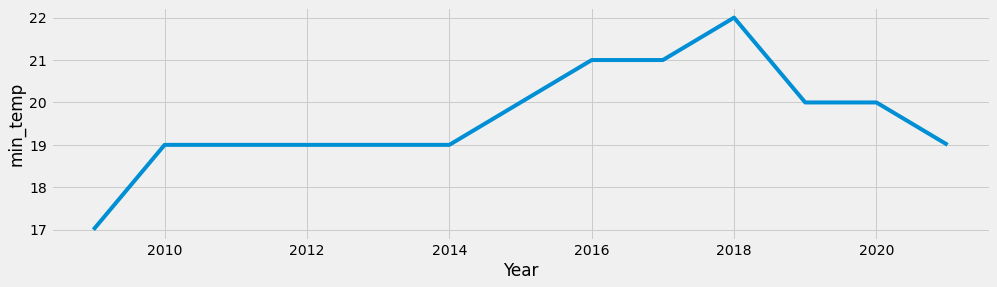

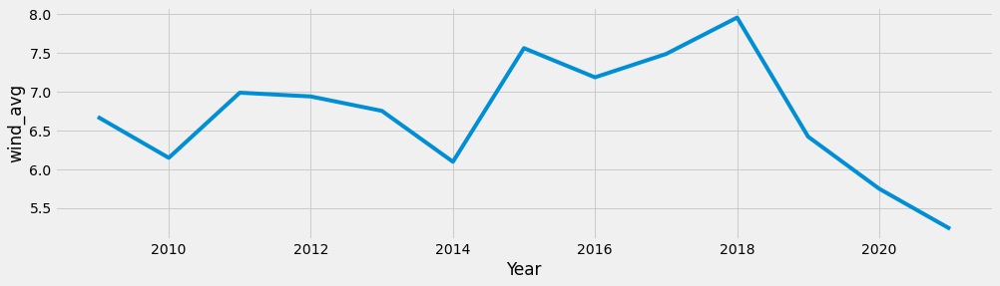

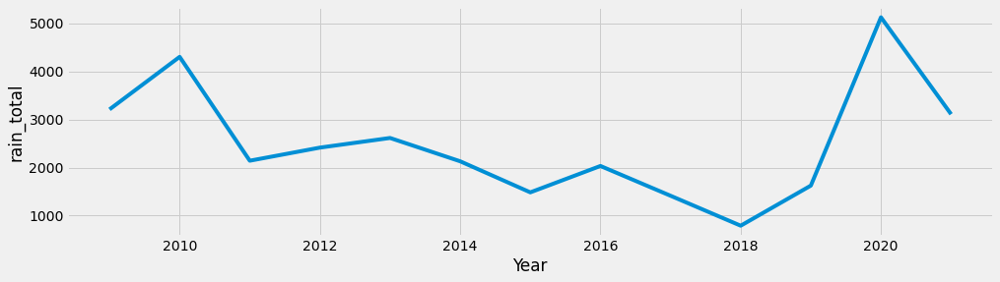

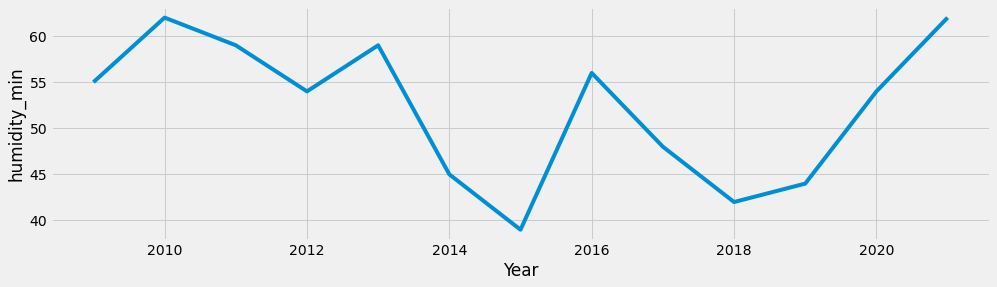

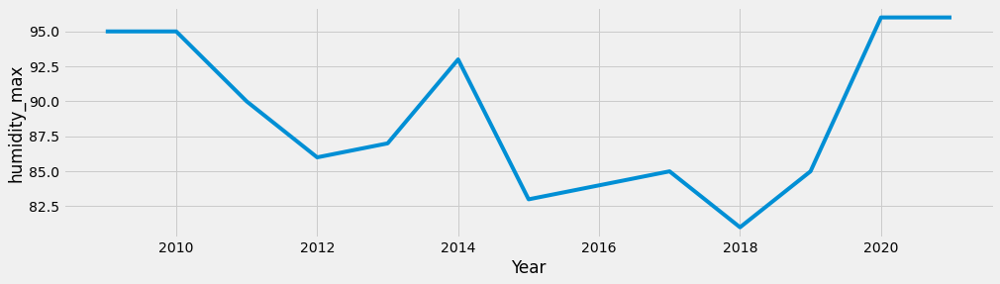

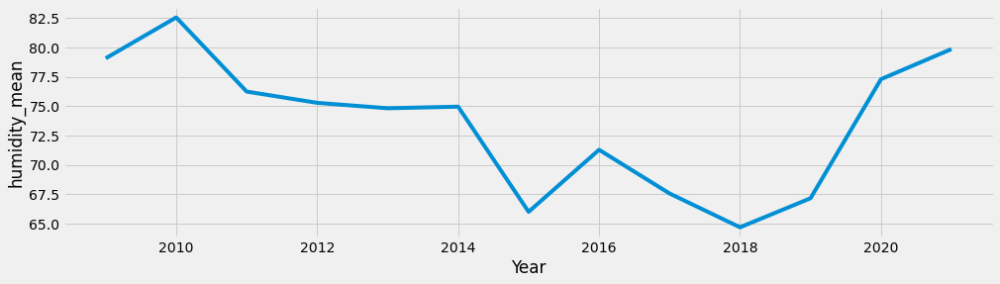

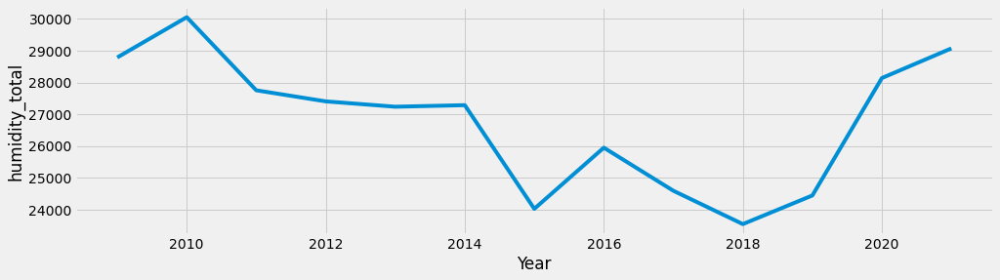

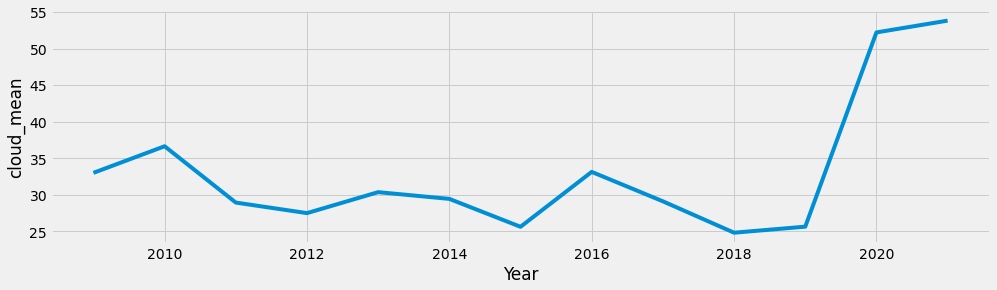

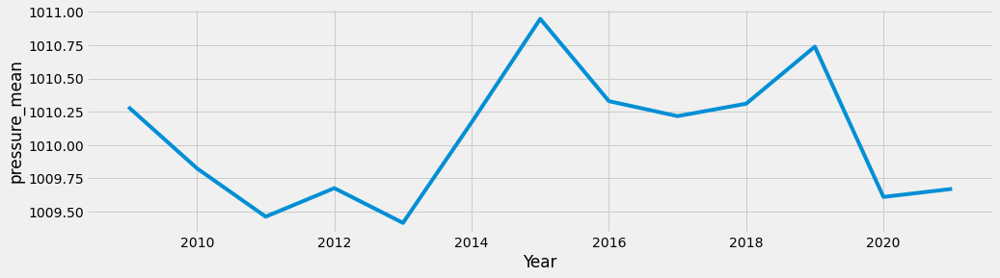

In [127]:
col = ['max_Temp', 'min_temp', 'wind_avg', 'rain_total',
       'humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total',
       'cloud_mean', 'pressure_mean']
for i in col:
    plt.figure(figsize=(15, 4))
    plt.style.use("fivethirtyeight")
    # Labelling the axes and setting
    # a title
    plt.xlabel("Year")
    plt.ylabel(i)
    plt.xticks(rotation=90)
    new.set_index('Year')[i].plot()

<ipython-input-128-01afe1843dd8>:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



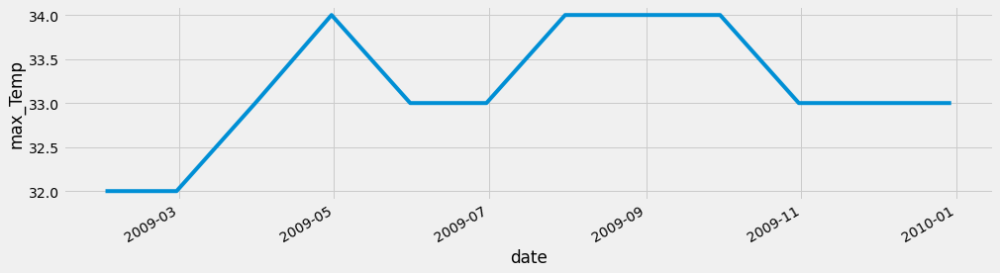

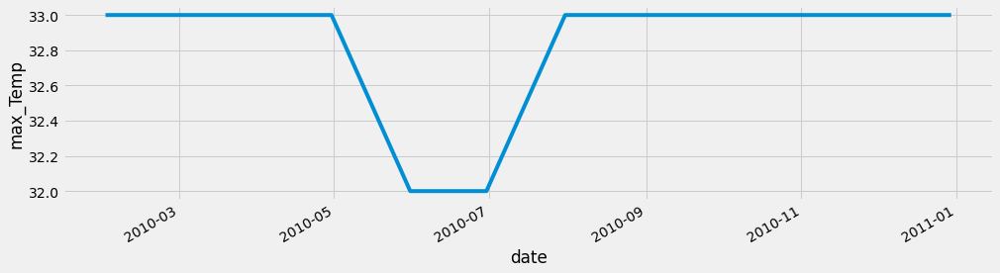

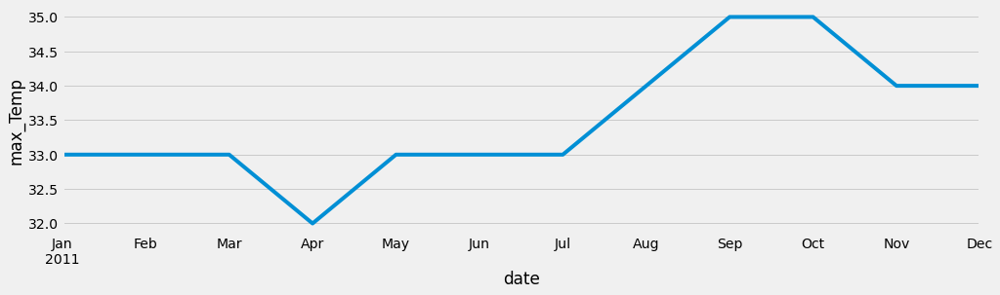

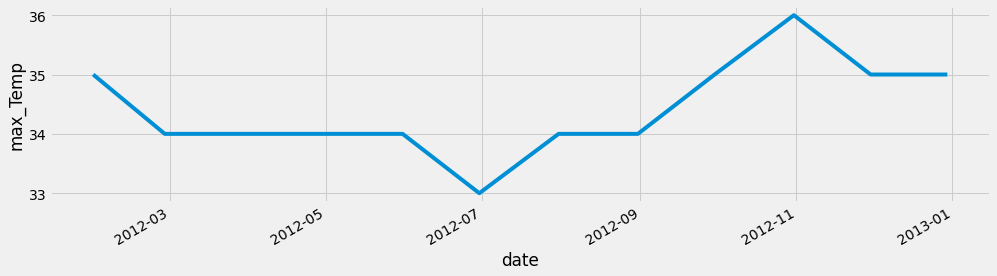

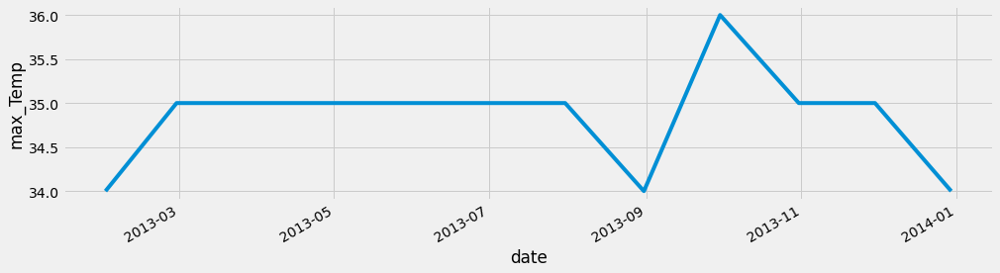

...

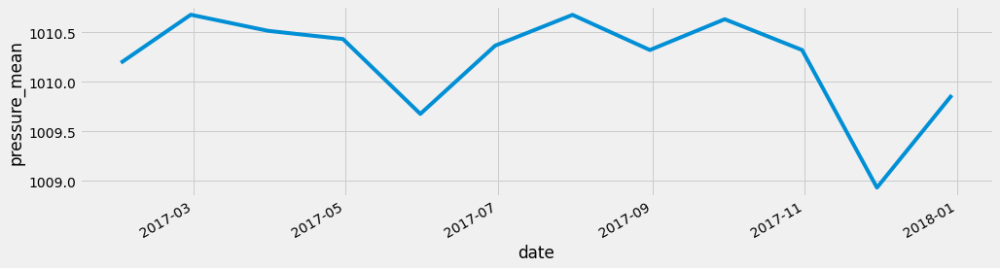

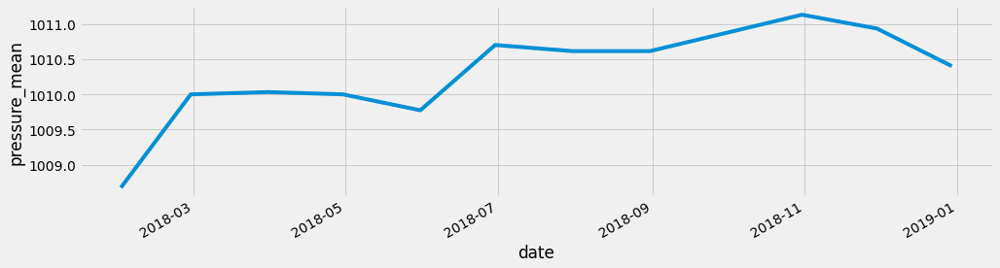

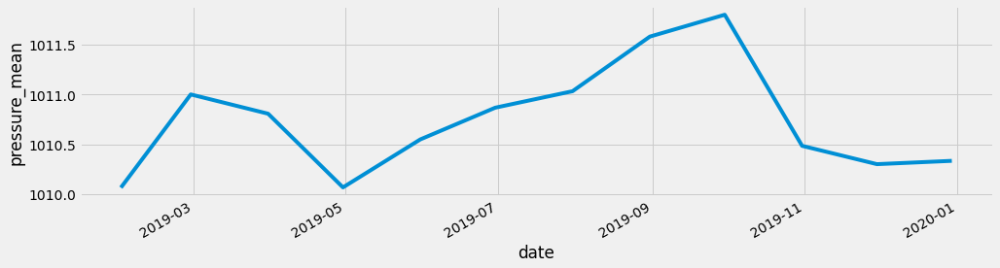

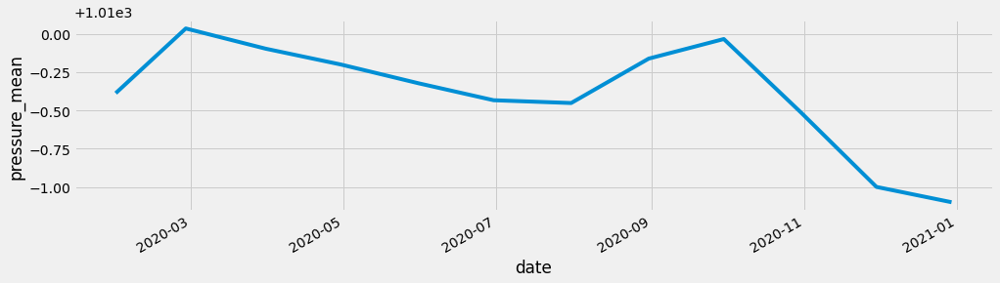

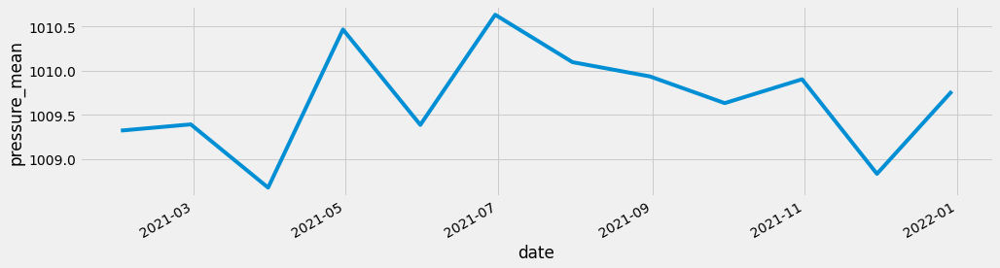

In [128]:
col = ['max_Temp', 'min_temp', 'wind_avg', 'rain_total', 'humidity_min', 'humidity_max', 
       'humidity_mean', 'humidity_total', 'cloud_mean', 'pressure_mean']

for i in col:
    for j in mm.Year.unique():
        plt.figure(figsize=(15, 4))
        plt.style.use("fivethirtyeight")
        # Labelling the axes and setting
        # a title
        plt.xlabel("Year")
        plt.ylabel(i)
        plt.xticks(rotation=90)
        mm[mm['Year']==j].set_index('date')[i].plot()

<ipython-input-129-962197f90172>:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



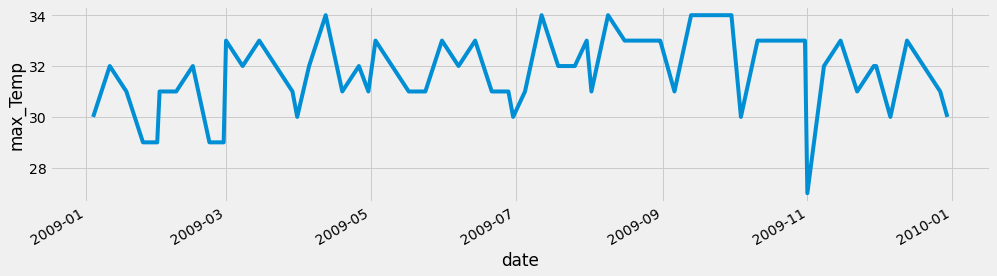

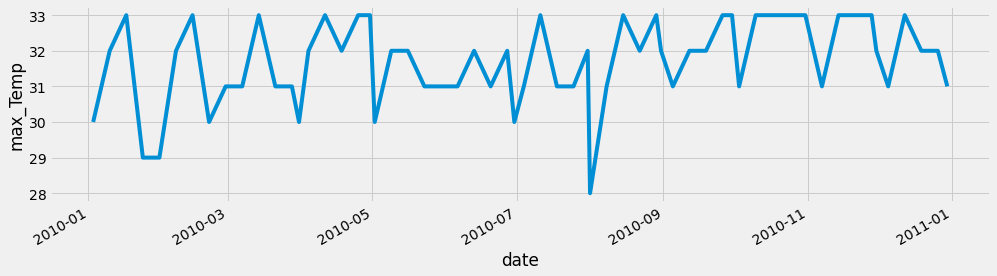

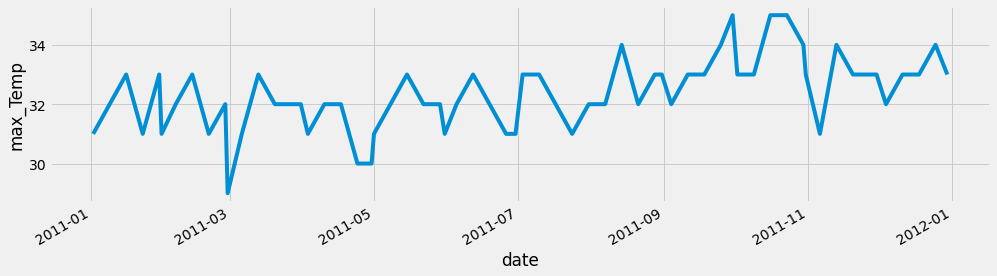

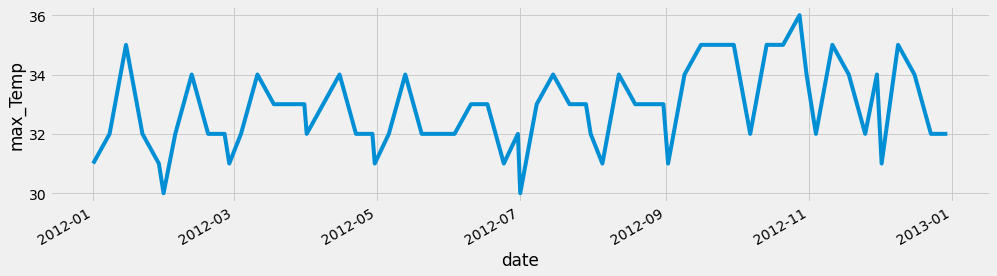

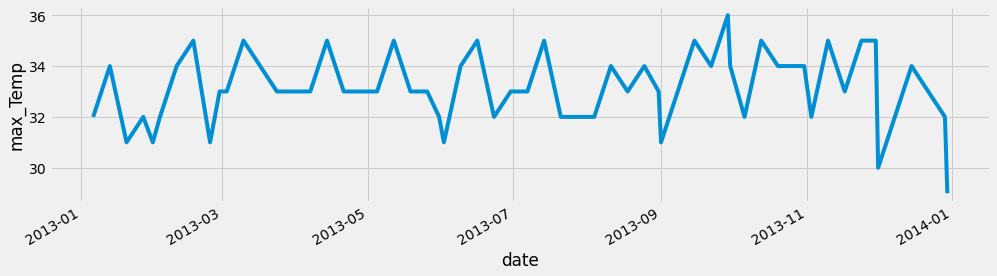

...

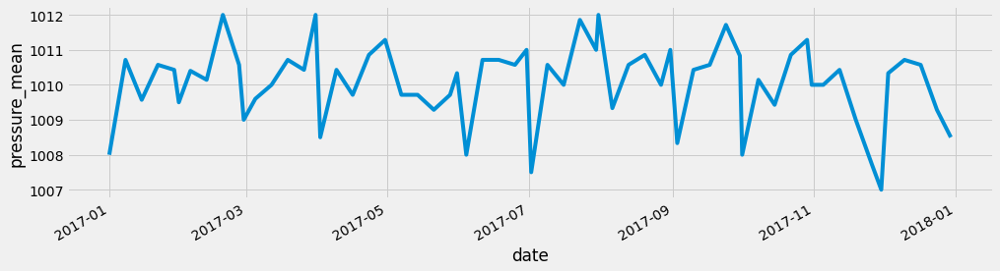

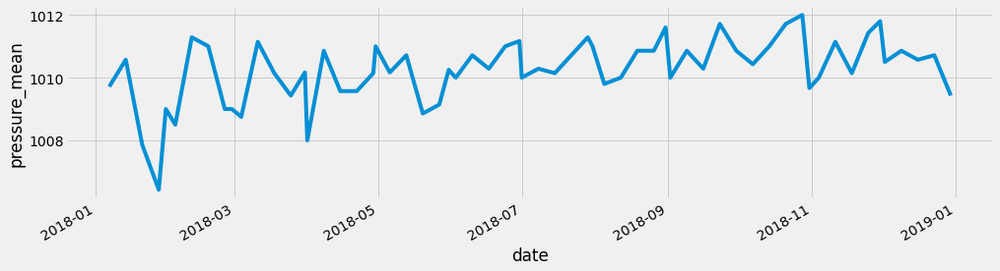

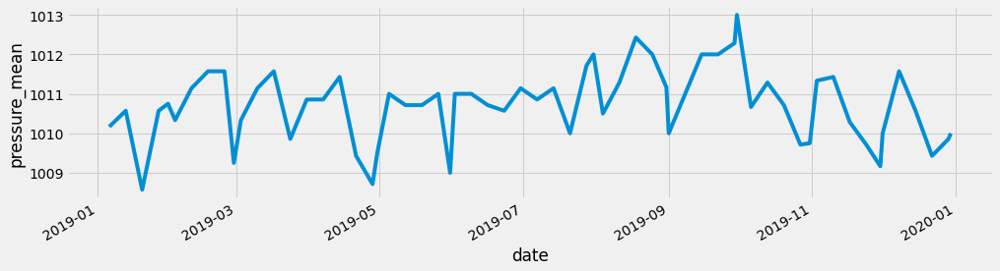

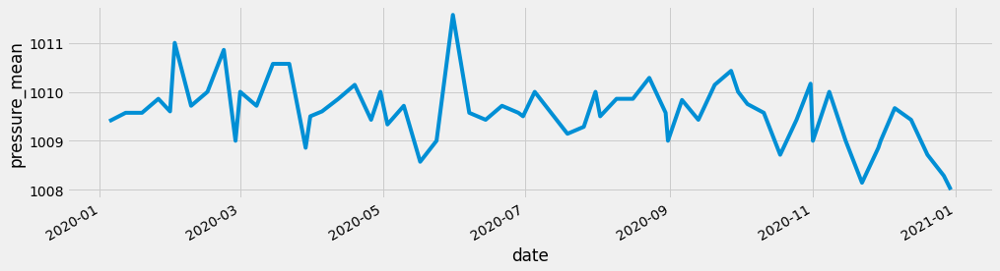

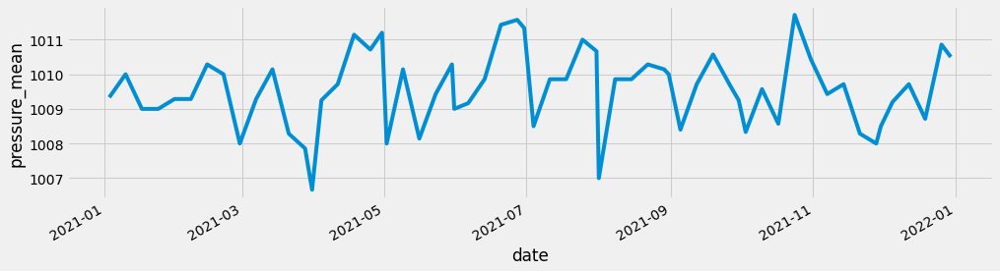

In [129]:
col = ['max_Temp', 'min_temp', 'wind_avg', 'rain_total', 'humidity_min', 'humidity_max', 
       'humidity_mean', 'humidity_total', 'cloud_mean', 'pressure_mean']

for i in col:
    for j in mm.Year.unique():
        plt.figure(figsize=(15, 4))
        plt.style.use("fivethirtyeight")
        # Labelling the axes and setting
        # a title
        plt.xlabel("Year")
        plt.ylabel(i)
        plt.xticks(rotation=90)
        ww[ww['Year']==j].set_index('date')[i].plot()

In [130]:
new.columns

Index(['Year', 'date', 'max_Temp', 'min_temp', 'wind_avg', 'rain_total',
       'humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total',
       'cloud_mean', 'pressure_mean', 'Rice Production'],
      dtype='object')

## Clustering:

In [131]:
new2 = new[(new["Year"]!=2009) & (new["Year"]!=2021)]
new2.drop(['Rice Production'],axis=1,inplace=True)
new2.shape

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(11, 12)

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



Text(0, 0.5, 'SSE')

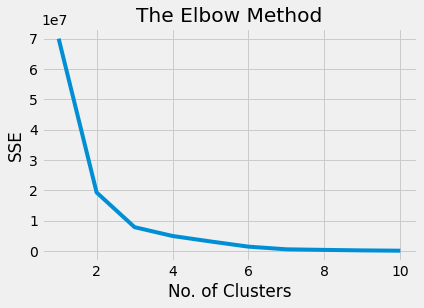

In [132]:
from sklearn.cluster import KMeans

X = new[['max_Temp', 'min_temp', 'wind_avg', 'rain_total', 'humidity_min', 'humidity_max', 'humidity_mean', 
                            'humidity_total', 'cloud_mean', 'pressure_mean',]].values
# Using the elbow method to find the optimal no. of cluster
ls=[]
for i in range(1,11):
    km=KMeans(n_clusters=i)
    km.fit(X)
    ls.append(km.inertia_)   # Sum squared distance of sample to their closest cluster distance
    
plt.plot(range(1,11),ls)
plt.title('The Elbow Method') 
plt.xlabel('No. of Clusters')
plt.ylabel('SSE')

In [133]:
#Fitting K-Means to Dataset
km=KMeans(n_clusters=3)
km.fit(X)
#print('The center of cluster are:\n',km.cluster_centers_)
y_means=km.fit_predict(X)
y_means

array([0, 0, 1, 1, 1, 1, 2, 1, 2, 2, 2, 0, 0])

In [134]:
new_1 = new.copy()
new_1['cluster'] = y_means

In [135]:
new_1[new_1['cluster']==0]

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean,Rice Production,cluster
0,2009,2009-12-30,34,17,6.676,"3,210.100",55,95,79.080,28785,33.008,"1,010.286",nan,0
1,2010,2010-12-30,33,19,6.149,"4,303.500",62,95,82.558,30051,36.646,"1,009.824","4,828.000",0
11,2020,2020-12-30,37,20,5.750,"5,126.300",54,96,77.302,28138,52.203,"1,009.610",191.860,0
12,2021,2021-12-30,36,19,5.232,"3,110.400",62,96,79.863,29070,53.816,"1,009.670",nan,0


In [136]:
new_1[new_1['cluster']==1]

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean,Rice Production,cluster
2,2011,2011-12-30,35,19,6.989,"2,142.100",59,90,76.245,27753,28.948,"1,009.462","4,985.000",1
3,2012,2012-12-30,36,19,6.939,"2,414.700",54,86,75.288,27405,27.505,"1,009.676","3,962.000",1
4,2013,2013-12-30,36,19,6.754,"2,615.300",59,87,74.827,27237,30.371,"1,009.415","1,880.000",1
5,2014,2014-12-30,37,19,6.098,"2,129.900",45,93,74.962,27286,29.451,"1,010.170","2,031.000",1
7,2016,2016-12-30,36,21,7.186,"2,032.500",56,84,71.291,25950,33.140,"1,010.330",nan,1


In [137]:
new_1[new_1['cluster']==2]

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean,Rice Production,cluster
6,2015,2015-12-30,37,20,7.562,"1,483.500",39,83,66.011,24028,25.637,"1,010.948","1,475.000",2
8,2017,2017-12-30,38,21,7.487,"1,412.800",48,85,67.571,24596,29.121,"1,010.217",nan,2
9,2018,2018-12-30,38,22,7.957,789.700,42,81,64.692,23548,24.830,"1,010.310",360.000,2
10,2019,2019-12-30,39,20,6.421,"1,624.100",44,85,67.165,24448,25.654,"1,010.739",465.030,2


In [138]:
new_1.columns

Index(['Year', 'date', 'max_Temp', 'min_temp', 'wind_avg', 'rain_total',
       'humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total',
       'cloud_mean', 'pressure_mean', 'Rice Production', 'cluster'],
      dtype='object')

In [139]:
new_1[new_1['cluster']==0][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total','Rice Production']].describe()

,humidity_min,humidity_max,humidity_mean,humidity_total,Rice Production
count,4.000,4.000,4.000,4.000,2.000
mean,58.250,95.500,79.701,"29,011.000","2,509.930"
std,4.349,0.577,2.185,795.463,"3,278.246"
min,54.000,95.000,77.302,"28,138.000",191.860
25%,54.750,95.000,78.635,"28,623.250","1,350.895"
50%,58.500,95.500,79.471,"28,927.500","2,509.930"
75%,62.000,96.000,80.536,"29,315.250","3,668.965"
max,62.000,96.000,82.558,"30,051.000","4,828.000"


In [140]:
new_1[new_1['cluster']==1][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total','Rice Production']].describe()

,humidity_min,humidity_max,humidity_mean,humidity_total,Rice Production
count,5.000,5.000,5.000,5.000,4.000
mean,54.600,88.000,74.523,"27,126.200","3,214.500"
std,5.771,3.536,1.889,687.726,"1,513.824"
min,45.000,84.000,71.291,"25,950.000","1,880.000"
25%,54.000,86.000,74.827,"27,237.000","1,993.250"
50%,56.000,87.000,74.962,"27,286.000","2,996.500"
75%,59.000,90.000,75.288,"27,405.000","4,217.750"
max,59.000,93.000,76.245,"27,753.000","4,985.000"


In [141]:
new_1[new_1['cluster']==2][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total','Rice Production']].describe()

,humidity_min,humidity_max,humidity_mean,humidity_total,Rice Production
count,4.000,4.000,4.000,4.000,3.000
mean,43.250,83.500,66.360,"24,155.000",766.677
std,3.775,1.915,1.293,470.782,615.670
min,39.000,81.000,64.692,"23,548.000",360.000
25%,41.250,82.500,65.681,"23,908.000",412.515
50%,43.000,84.000,66.588,"24,238.000",465.030
75%,45.000,85.000,67.266,"24,485.000",970.015
max,48.000,85.000,67.571,"24,596.000","1,475.000"


## Clustering only using humidity parameters:

In [142]:
new3 = new[(new["Year"]!=2009) & (new["Year"]!=2021)]
new3.drop(['date', 'max_Temp', 'min_temp', 'wind_avg', 'rain_total',
       'cloud_mean', 'pressure_mean', 'Rice Production'],axis=1,inplace=True)
new3.shape

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(11, 5)

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



Text(0, 0.5, 'SSE')

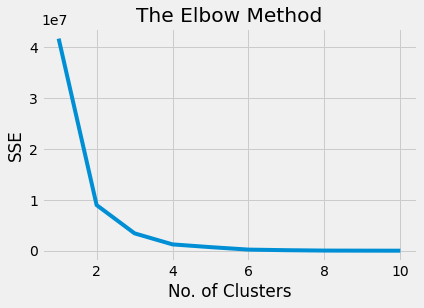

In [143]:
from sklearn.cluster import KMeans

X = new3[['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].values
# Using the elbow method to find the optimal no. of cluster
ls=[]
for i in range(1,11):
    km=KMeans(n_clusters=i)
    km.fit(X)
    ls.append(km.inertia_)   # Sum squared distance of sample to their closest cluster distance
    
plt.plot(range(1,11),ls)
plt.title('The Elbow Method') 
plt.xlabel('No. of Clusters')
plt.ylabel('SSE')

In [144]:
#Fitting K-Means to Dataset
km=KMeans(n_clusters=3)
km.fit(X)
#print('The center of cluster are:\n',km.cluster_centers_)
y_means=km.fit_predict(X)
y_means

new3['cluster'] = y_means
new3[new3['cluster']==0]

<ipython-input-144-eef9901bde96>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
2,2011,59,90,76.245,27753,0
3,2012,54,86,75.288,27405,0
4,2013,59,87,74.827,27237,0
5,2014,45,93,74.962,27286,0
7,2016,56,84,71.291,25950,0
11,2020,54,96,77.302,28138,0


In [145]:
new3[new3['cluster']==1]

,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
1,2010,62,95,82.558,30051,1


In [146]:
new3[new3['cluster']==2]

,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
6,2015,39,83,66.011,24028,2
8,2017,48,85,67.571,24596,2
9,2018,42,81,64.692,23548,2
10,2019,44,85,67.165,24448,2


### Weekly Clustering:

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\shailen.tewathia\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



(685, 7)


Text(0, 0.5, 'SSE')

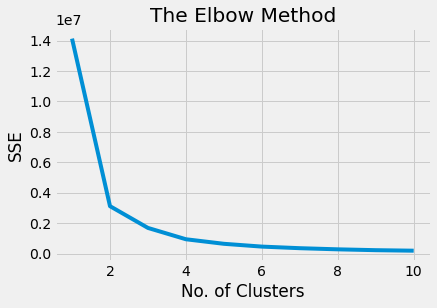

In [148]:
wwc = ww[(ww["Year"]!=2009) & (ww["Year"]!=2021)]
wwc.drop(['date', 'max_Temp', 'min_temp', 'wind_avg', 'rain_total','cloud_mean', 'pressure_mean'],axis=1,inplace=True)
print(wwc.shape)


from sklearn.cluster import KMeans
X = wwc[['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].values
# Using the elbow method to find the optimal no. of cluster
ls=[]
for i in range(1,11):
    km=KMeans(n_clusters=i)
    km.fit(X)
    ls.append(km.inertia_)   # Sum squared distance of sample to their closest cluster distance
    
plt.plot(range(1,11),ls)
plt.title('The Elbow Method') 
plt.xlabel('No. of Clusters')
plt.ylabel('SSE')

In [149]:
#Fitting K-Means to Dataset
km=KMeans(n_clusters=3)
km.fit(X)
#print('The center of cluster are:\n',km.cluster_centers_)
y_means=km.fit_predict(X)
y_means

wwc['cluster'] = y_means
wwc.head(10)

<ipython-input-149-b1753ba8d62c>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,Month,Week,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
63,2010,1,1,77,86,81.286,569,1
64,2010,1,2,75,87,83.143,582,1
65,2010,1,3,83,88,85.571,599,1
66,2010,1,4,85,91,87.857,615,1
67,2010,1,53,86,89,87.333,262,2
68,2010,2,5,81,86,83.143,582,1
69,2010,2,6,75,88,80.429,563,1
70,2010,2,7,87,94,89.571,627,1
71,2010,2,8,79,90,86.429,605,1
72,2010,3,9,81,86,83.714,586,1


In [157]:
wwc[wwc['cluster'] == 0].Year.value_counts()

2018    35
2015    33
2019    27
2017    22
2014    12
2016    11
2013    11
2020    10
2012     9
2011     9
2010     7
Name: Year, dtype: int64

In [164]:
print('Cluster = 0')
wwc[wwc['cluster'] == 0][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].describe()

Cluster = 0


,humidity_min,humidity_max,humidity_mean,humidity_total
count,186.000,186.000,186.000,186.000
mean,61.591,73.220,67.602,396.167
std,10.492,7.427,8.333,53.965
min,39.000,54.000,47.714,277.000
25%,54.000,68.000,62.286,359.250
50%,60.000,73.000,64.857,416.000
75%,69.000,78.000,72.688,442.000
max,85.000,94.000,87.800,459.000


- Low himidity

In [163]:
print('Cluster = 1')
wwc[wwc['cluster'] == 1][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].describe()

Cluster = 1


,humidity_min,humidity_max,humidity_mean,humidity_total
count,380.000,380.000,380.000,380.000
mean,68.929,80.150,75.071,521.918
std,7.511,5.133,5.241,36.984
min,45.000,68.000,65.714,460.000
25%,64.000,76.000,71.000,491.750
50%,69.000,80.000,74.857,517.500
75%,75.000,84.000,79.321,551.250
max,87.000,95.000,89.571,627.000


- High Himidity

In [162]:
print('Cluster = 2')
wwc[wwc['cluster'] == 2][['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].describe()

Cluster = 2


,humidity_min,humidity_max,humidity_mean,humidity_total
count,119.000,119.000,119.000,119.000
mean,72.143,75.849,73.928,154.824
std,7.996,7.905,7.598,66.975
min,51.000,56.000,53.667,56.000
25%,66.000,70.000,68.000,80.000
50%,73.000,76.000,74.667,156.000
75%,78.000,81.000,80.000,213.000
max,88.000,96.000,89.000,272.000


- Moderate Himidity

In [161]:
for i in [2015,2018,2019,2020]:
    print('Year: ',i)
    print(wwc[wwc['Year']==i]['cluster'].value_counts())

Year:  2015
0    33
1    18
2    12
Name: cluster, dtype: int64
Year:  2018
0    35
1    16
2    11
Name: cluster, dtype: int64
Year:  2019
0    27
1    24
2    11
Name: cluster, dtype: int64
Year:  2020
1    42
2    11
0    10
Name: cluster, dtype: int64


## Selecting the number of clusters with silhouette analysis:

In [ ]:
'''

Elbow method is used to find the “elbow” point, where adding additional data samples does not change cluster membership much. 
Silhouette score determines whether there are large gaps between each sample and all other samples within the same cluster or across different clusters. 

'''

In [54]:
##https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [55]:
range_n_clusters = [2, 3, 4, 5, 6]

X = new3[['humidity_min', 'humidity_max', 'humidity_mean', 'humidity_total']].values

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

For n_clusters = 2 The average silhouette_score is : 0.6649444239144519
For n_clusters = 3 The average silhouette_score is : 0.6258633989959733
For n_clusters = 4 The average silhouette_score is : 0.5639321158212218
For n_clusters = 5 The average silhouette_score is : 0.5166330040221587
For n_clusters = 6 The average silhouette_score is : 0.47684271397189343


In [56]:
#Fitting K-Means to Dataset
clusterer = KMeans(n_clusters=2)
y_means = clusterer.fit_predict(X)
y_means

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0])

In [57]:
new3['cluster'] = y_means
new3[new3['cluster']==0]

<ipython-input-57-02ed85f56f6d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
1,2010,62,95,82.558,30051,0
2,2011,59,90,76.245,27753,0
3,2012,54,86,75.288,27405,0
4,2013,59,87,74.827,27237,0
5,2014,45,93,74.962,27286,0
11,2020,54,96,77.302,28138,0


In [58]:
new3['cluster'] = y_means
new3[new3['cluster']==1]

<ipython-input-58-0b9e39991e5a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster
6,2015,39,83,66.011,24028,1
7,2016,56,84,71.291,25950,1
8,2017,48,85,67.571,24596,1
9,2018,42,81,64.692,23548,1
10,2019,44,85,67.165,24448,1


#### With Visualisations:

For n_clusters = 2 The average silhouette_score is : 0.6649444239144519
For n_clusters = 3 The average silhouette_score is : 0.6258633989959733
For n_clusters = 4 The average silhouette_score is : 0.5639321158212218
For n_clusters = 5 The average silhouette_score is : 0.5166330040221587
For n_clusters = 6 The average silhouette_score is : 0.47684271397189343


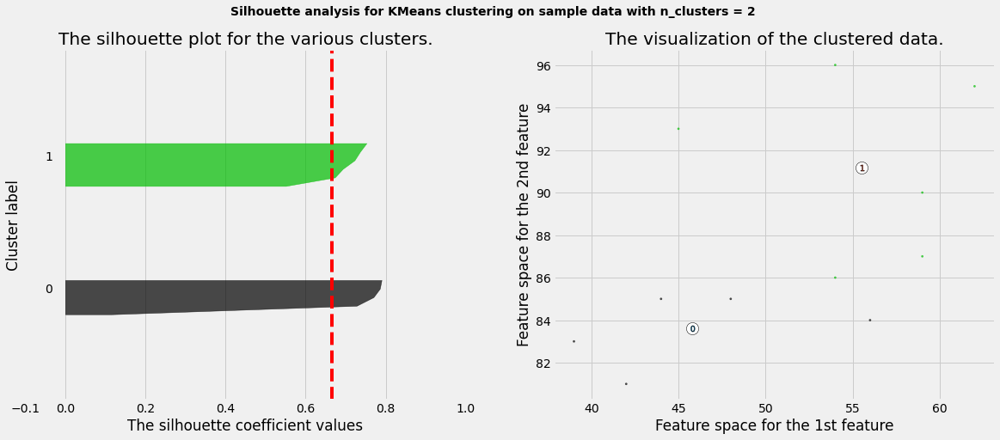

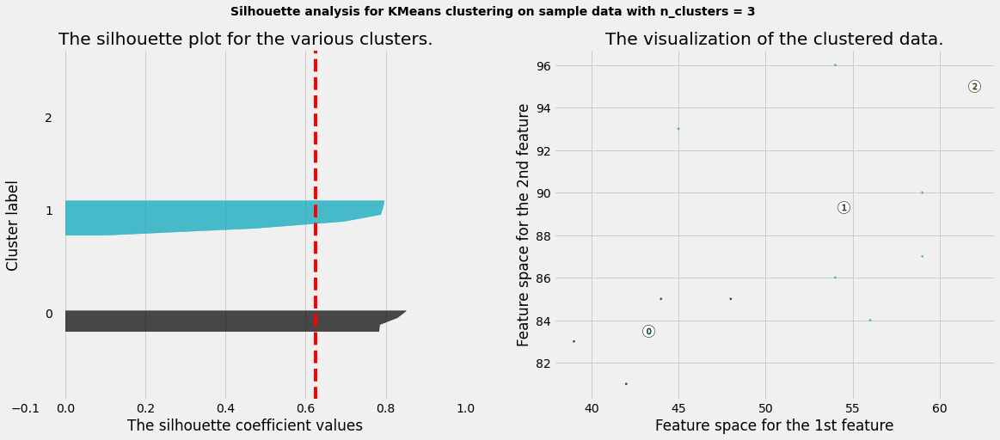

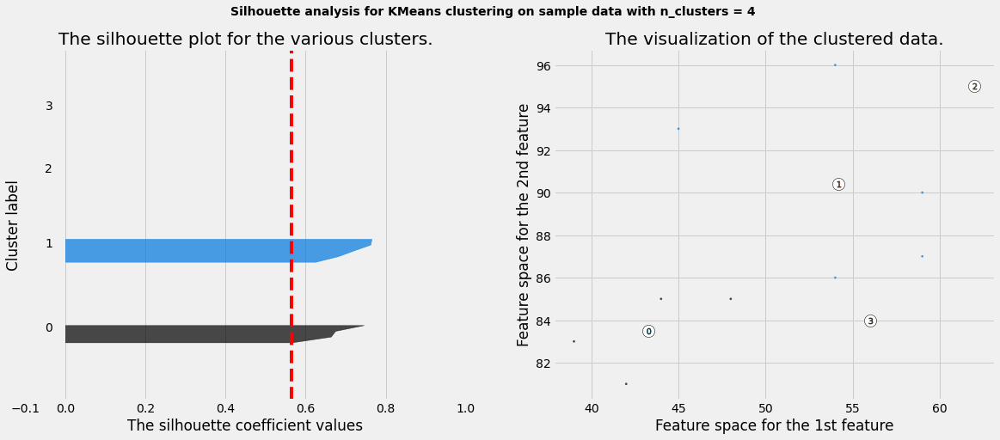

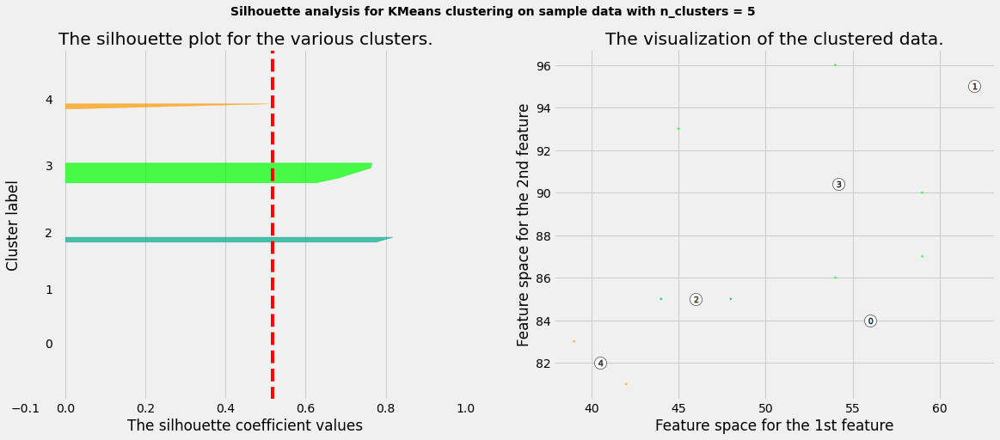

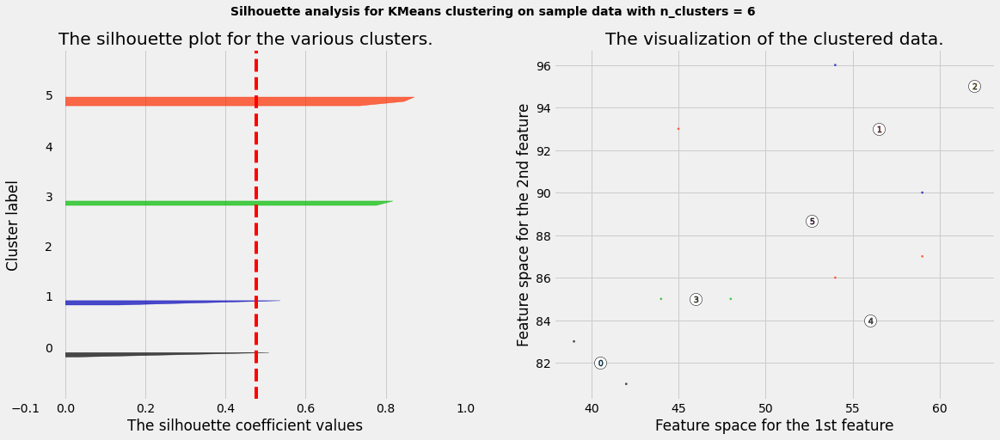

In [59]:
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## DBSCAN (Density-Based Spatial Clustering of Applications with Noise):

In [60]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances

array([[   0.        , 1913.02420796],
       [   0.        ,  348.06021608],
       [   0.        ,  119.54541764],
       [   0.        ,   51.31294302],
       [   0.        ,   51.31294302],
       [   0.        ,  420.03610721],
       [   0.        , 1287.0118497 ],
       [   0.        ,  148.05460249],
       [   0.        ,  480.0153528 ],
       [   0.        ,  148.05460249],
       [   0.        ,  385.0806652 ]])

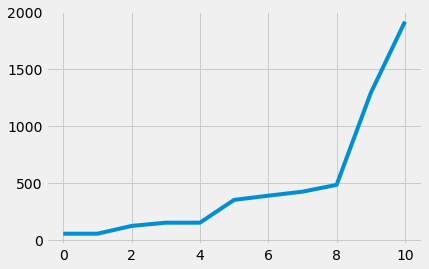

In [61]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
'''
We train our model, 
selecting 500 for eps (since at 500 there is sudden increase) and
setting min_samples to 4 (since from count of 4 from 0 i.e at 8 on x-axis there is sudden change)
'''

In [62]:
from sklearn.cluster import DBSCAN
import numpy as np
DBSCAN_cluster = DBSCAN(eps=500, min_samples=4).fit(X) 

In [63]:
DBSCAN_cluster.labels_

array([-1,  0,  0,  0,  0, -1, -1, -1, -1, -1,  0], dtype=int64)

In [64]:
y_means = DBSCAN_cluster.fit_predict(X)
new3['clusterDB'] = y_means

<ipython-input-64-352217bf9e79>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [65]:
new3

,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster,clusterDB
1,2010,62,95,82.558,30051,0,-1
2,2011,59,90,76.245,27753,0,0
3,2012,54,86,75.288,27405,0,0
4,2013,59,87,74.827,27237,0,0
5,2014,45,93,74.962,27286,0,0
6,2015,39,83,66.011,24028,1,-1
7,2016,56,84,71.291,25950,1,-1
8,2017,48,85,67.571,24596,1,-1
9,2018,42,81,64.692,23548,1,-1
10,2019,44,85,67.165,24448,1,-1


## Using Scaling: Facing Challenge

In [66]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X1 = sc.fit_transform(X)

In [67]:
X1 = np.around(X1, decimals=2)
X1

array([[ 1.46,  1.51,  1.87,  1.87],
       [ 1.06,  0.47,  0.69,  0.69],
       [ 0.39, -0.36,  0.51,  0.51],
       [ 1.06, -0.15,  0.43,  0.43],
       [-0.82,  1.1 ,  0.45,  0.45],
       [-1.62, -0.98, -1.22, -1.22],
       [ 0.66, -0.78, -0.23, -0.23],
       [-0.41, -0.57, -0.93, -0.93],
       [-1.22, -1.4 , -1.47, -1.47],
       [-0.95, -0.57, -1.  , -1.  ],
       [ 0.39,  1.72,  0.89,  0.89]])

In [68]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X1)
distances, indices = nbrs.kneighbors(X1)

In [69]:
distances

array([[0.        , 1.7634625 ],
       [0.        , 0.72083285],
       [0.        , 0.71119618],
       [0.        , 0.71119618],
       [0.        , 1.49522574],
       [0.        , 0.67926431],
       [0.        , 1.15952577],
       [0.        , 0.54899909],
       [0.        , 0.67926431],
       [0.        , 0.54899909],
       [0.        , 1.44616735]])

In [70]:
distances = np.around(distances, decimals=2)
distances

array([[0.  , 1.76],
       [0.  , 0.72],
       [0.  , 0.71],
       [0.  , 0.71],
       [0.  , 1.5 ],
       [0.  , 0.68],
       [0.  , 1.16],
       [0.  , 0.55],
       [0.  , 0.68],
       [0.  , 0.55],
       [0.  , 1.45]])

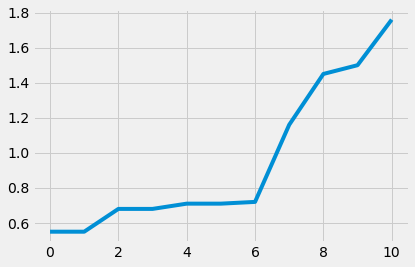

In [71]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [72]:
from sklearn.cluster import DBSCAN
import numpy as np
DBSCAN_cluster = DBSCAN(eps=0.6, min_samples=3).fit(X) 

In [73]:
DBSCAN_cluster.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1], dtype=int64)

In [76]:
y_means = DBSCAN_cluster.fit_predict(X)
new3['clusterDB'] = y_means

<ipython-input-76-352217bf9e79>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [77]:
new3

,Year,humidity_min,humidity_max,humidity_mean,humidity_total,cluster,clusterDB
1,2010,62,95,82.558,30051,0,-1
2,2011,59,90,76.245,27753,0,-1
3,2012,54,86,75.288,27405,0,-1
4,2013,59,87,74.827,27237,0,-1
5,2014,45,93,74.962,27286,0,-1
6,2015,39,83,66.011,24028,1,-1
7,2016,56,84,71.291,25950,1,-1
8,2017,48,85,67.571,24596,1,-1
9,2018,42,81,64.692,23548,1,-1
10,2019,44,85,67.165,24448,1,-1


In [78]:
X

array([[   62.        ,    95.        ,    82.55769231, 30051.        ],
       [   59.        ,    90.        ,    76.24450549, 27753.        ],
       [   54.        ,    86.        ,    75.28846154, 27405.        ],
       [   59.        ,    87.        ,    74.82692308, 27237.        ],
       [   45.        ,    93.        ,    74.96153846, 27286.        ],
       [   39.        ,    83.        ,    66.01098901, 24028.        ],
       [   56.        ,    84.        ,    71.29120879, 25950.        ],
       [   48.        ,    85.        ,    67.57142857, 24596.        ],
       [   42.        ,    81.        ,    64.69230769, 23548.        ],
       [   44.        ,    85.        ,    67.16483516, 24448.        ],
       [   54.        ,    96.        ,    77.3021978 , 28138.        ]])

## Using Knee:

In [79]:
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)
distances = np.sort(distances[:, 10], axis=0)

Text(0, 0.5, 'Distance')

<Figure size 360x360 with 0 Axes>

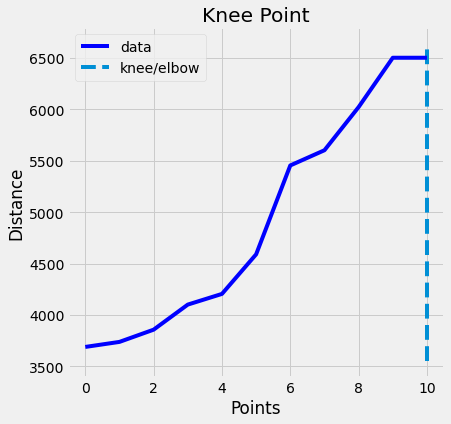

In [83]:
from kneed import KneeLocator
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

In [91]:
cls = DBSCAN(eps=distances[knee.knee], min_samples=5)
cls.fit(X)
label = cls.labels_

In [92]:
label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

#### We can also try Gap Statistic Method:

## Productivity:

In [233]:
#Importing the dataset:
pro1 = pd.read_excel(r"D:\00 MSIG\01 Agriculture\00 Parametric\Amako San\Datasets\Productivity - Depok.xlsx")
pro1

,Year,Productivity
0,2018,57.140
1,2019,54.720
2,2020,57.840


In [235]:
new5 = pd.merge(df1, pro1, on='Year', how="left")
new5

,Year,date,max_Temp,min_temp,wind_avg,rain_total,humidity_min,humidity_max,humidity_mean,humidity_total,cloud_mean,pressure_mean,Productivity
0,2009,2009-12-30,34,17,6.676,"3,210.100",55,95,79.080,28785,33.008,"1,010.286",nan
1,2010,2010-12-30,33,19,6.149,"4,303.500",62,95,82.558,30051,36.646,"1,009.824",nan
2,2011,2011-12-30,35,19,6.989,"2,142.100",59,90,76.245,27753,28.948,"1,009.462",nan
3,2012,2012-12-30,36,19,6.939,"2,414.700",54,86,75.288,27405,27.505,"1,009.676",nan
4,2013,2013-12-30,36,19,6.754,"2,615.300",59,87,74.827,27237,30.371,"1,009.415",nan
5,2014,2014-12-30,37,19,6.098,"2,129.900",45,93,74.962,27286,29.451,"1,010.170",nan
6,2015,2015-12-30,37,20,7.562,"1,483.500",39,83,66.011,24028,25.637,"1,010.948",nan
7,2016,2016-12-30,36,21,7.186,"2,032.500",56,84,71.291,25950,33.140,"1,010.330",nan
8,2017,2017-12-30,38,21,7.487,"1,412.800",48,85,67.571,24596,29.121,"1,010.217",nan
9,2018,2018-12-30,38,22,7.957,789.700,42,81,64.692,23548,24.830,"1,010.310",57.140


In [239]:
fig = px.scatter(new5, x='humidity_total', y ='Productivity',color="Year",title = "Measurement of Productivity according to Humidity Total")
fig.show()

In [241]:
fig = px.scatter(new5, x='rain_total', y ='Productivity',color="Year",title = "Measurement of Productivity according to Rain Total")
fig.show()

In [245]:
rice_corrs = new5.corr()["Productivity"].sort_values(ascending=False)
#rice_corrs = rice_corrs[(rice_corrs > 0.3)|(rice_corrs < -0.3)]

corr_cols = rice_corrs.index.tolist()
corr_cols

['Productivity',
 'cloud_mean',
 'humidity_min',
 'rain_total',
 'humidity_total',
 'humidity_mean',
 'humidity_max',
 'min_temp',
 'Year',
 'wind_avg',
 'pressure_mean',
 'max_Temp']

Productivity      1.000
cloud_mean        0.654
humidity_min      0.550
rain_total        0.528
humidity_total    0.525
humidity_mean     0.525
humidity_max      0.461
min_temp          0.303
Year              0.214
wind_avg          0.007
pressure_mean    -0.902
max_Temp         -0.953
Name: Productivity, dtype: float64


<AxesSubplot:>

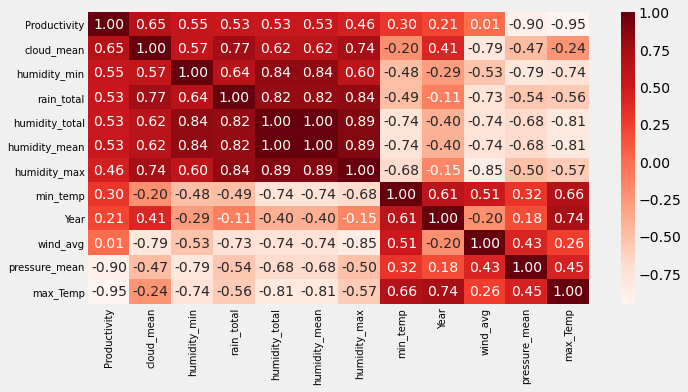

In [246]:
print(rice_corrs)
plt.figure(figsize=(10,5))
plt.tick_params(labelsize=10)
sns.heatmap(new5[corr_cols].corr(),annot=True, cmap= plt.cm.Reds, fmt='.2f')